## Modelo 1

Using cuda device
Step: 6, Action: 0, Shares: 0, Cash: 100000.00, Portfolio: 100000.00, Reward: 0.00
Step: 7, Action: 1, Shares: 0, Cash: 100000.00, Portfolio: 100000.00, Reward: 0.00
Step: 8, Action: 1, Shares: 0, Cash: 100000.00, Portfolio: 100000.00, Reward: 0.00
Step: 9, Action: 1, Shares: 0, Cash: 100000.00, Portfolio: 100000.00, Reward: 0.00
Step: 10, Action: 1, Shares: 0, Cash: 100000.00, Portfolio: 100000.00, Reward: 0.00
Step: 11, Action: 0, Shares: 0, Cash: 100000.00, Portfolio: 100000.00, Reward: 0.00
Step: 12, Action: 1, Shares: 0, Cash: 100000.00, Portfolio: 100000.00, Reward: 0.00
Step: 13, Action: 1, Shares: 0, Cash: 100000.00, Portfolio: 100000.00, Reward: 0.00
Step: 14, Action: 1, Shares: 0, Cash: 100000.00, Portfolio: 100000.00, Reward: 0.00
Step: 15, Action: 2, Shares: 7112, Cash: 5.28, Portfolio: 100000.00, Reward: 0.00
Step: 16, Action: 2, Shares: 7112, Cash: 5.28, Portfolio: 99857.76, Reward: -142.24
Step: 17, Action: 1, Shares: 7112, Cash: 5.28, Portfolio: 96863.

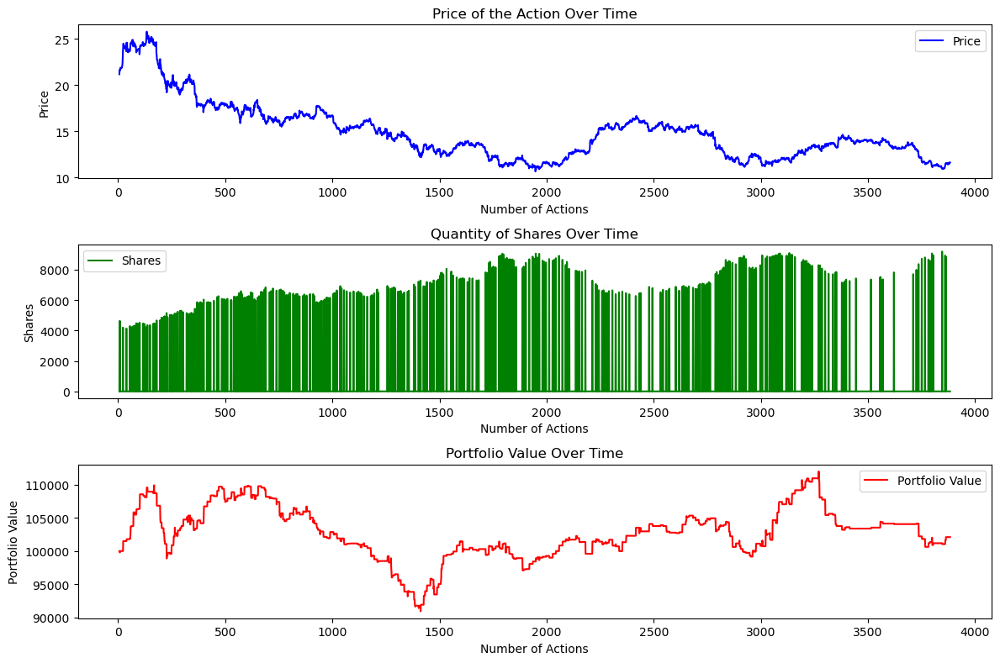

Portfolio Value: 102109.95549999984


In [24]:
import os
import gym
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import alpaca_trade_api as tradeapi
from gym import spaces
from stable_baselines3 import DQN
from stable_baselines3.common.vec_env import DummyVecEnv

# ======================================
# Configuration: Insert your Alpaca Keys
# ======================================
ALPACA_API_KEY_ID = 'Your_API_Key'
ALPACA_API_SECRET_KEY = "Your_Secret_Alpaca_Key"
ALPACA_BASE_URL = "https://paper-api.alpaca.markets"

# ======================================
# 1. Discrete Trading Environment (Buy/Hold/Sell)
# ======================================
class DiscreteTradingEnv(gym.Env):
    metadata = {'render.modes': ['human']}

    def __init__(
        self,
        alpaca_api_key,
        alpaca_api_secret,
        alpaca_base_url,
        ticker="F",
        initial_cash=100_000,
        lookback_window=1,
        start_date="2022-01-01",
        end_date="2022-06-30",
        timeframe='1Hour'
    ):
        super(DiscreteTradingEnv, self).__init__()

        self.alpaca_api_key = alpaca_api_key
        self.alpaca_api_secret = alpaca_api_secret
        self.alpaca_base_url = alpaca_base_url
        self.ticker = ticker
        self.initial_cash = initial_cash
        self.lookback_window = lookback_window
        self.start_date = start_date
        self.end_date = end_date
        self.timeframe = timeframe

        self.api = tradeapi.REST(
            self.alpaca_api_key,
            self.alpaca_api_secret,
            self.alpaca_base_url,
            api_version='v2'
        )

        # Actions: 0 = Sell All, 1 = Hold, 2 = Buy (all-in with available cash)
        self.action_space = spaces.Discrete(3)

        # Observation includes OHLCV for lookback_window steps, plus shares held and cash
        obs_size = (self.lookback_window * 5) + 2
        self.observation_space = spaces.Box(low=0.0, high=np.inf, shape=(obs_size,), dtype=np.float32)

        self.all_data = self._fetch_historical_data()
        self.reset()

    def _fetch_historical_data(self):
        bars = self.api.get_bars(
            symbol=self.ticker,
            timeframe=self.timeframe,
            start=self.start_date,
            end=self.end_date
        )
        data = pd.DataFrame([{
            'time': bar.t,
            'open': bar.o,
            'high': bar.h,
            'low': bar.l,
            'close': bar.c,
            'volume': bar.v
        } for bar in bars])
        data.set_index('time', inplace=True)
        data.sort_index(inplace=True)
        data.reset_index(drop=True, inplace=True)
        return data

    def reset(self):
        self.data = self.all_data.copy()
        self.current_step = self.lookback_window
        self.cash = float(self.initial_cash)
        self.shares = 0
        self.done = False
        self.episode_reward = 0.0
        return self._next_observation()

    def _next_observation(self):
        start = self.current_step - self.lookback_window
        end = self.current_step
        window_data = self.data.iloc[start:end]

        obs_data = []
        for _, row in window_data.iterrows():
            obs_data.extend([
                row['open'],
                row['high'],
                row['low'],
                row['close'],
                row['volume'],
            ])

        # Add shares held and cash as part of the observation
        obs_data.append(self.shares)
        obs_data.append(self.cash)

        return np.array(obs_data, dtype=np.float32)


    
    def step(self, action):
        old_portfolio_value = self._get_portfolio_value()

        # Current price
        row = self.data.iloc[self.current_step]
        current_price = row['close']

        # Execute action
        if action == 0:
            # Sell all shares
            self.cash += self.shares * current_price
            self.shares = 0
        elif action == 1:
            # Hold (do nothing)
            pass
        elif action == 2:
            # Buy as many shares as possible with the available cash
            if current_price > 0:
                shares_to_buy = int(self.cash // current_price)
                self.cash -= shares_to_buy * current_price
                self.shares += shares_to_buy

        # Move forward in time
        self.current_step += 1
        if self.current_step >= len(self.data):
            self.done = True

        # Compute new portfolio value
        new_portfolio_value = self._get_portfolio_value()
        reward = new_portfolio_value - old_portfolio_value

        # If portfolio reaches at least 120% of initial cash, give a large bonus
        if new_portfolio_value >= (self.initial_cash * 1.2):
            reward += 1000  # Large bonus

        self.episode_reward += reward

        print(f"Step: {self.current_step}, Action: {action}, Shares: {self.shares}, "
              f"Cash: {self.cash:.2f}, Portfolio: {new_portfolio_value:.2f}, Reward: {reward:.2f}")

        if self.done:
            print(f"Episode finished. Total Episode Reward: {self.episode_reward:.2f}")

        

        obs = self._next_observation() if not self.done else np.zeros(self.observation_space.shape, dtype=np.float32)
        info = {'portfolio_value': new_portfolio_value}
        return obs, reward, self.done, info

    def _get_portfolio_value(self):
        current_price = self.data.iloc[self.current_step - 1]['close']
        return self.cash + (self.shares * current_price)

    def render(self, mode='human'):
        portfolio_value = self._get_portfolio_value()
        print(f"Step: {self.current_step}, Shares: {self.shares}, Cash: {self.cash:.2f}, Portfolio: {portfolio_value:.2f}")

# ======================================
# 2. Main Script
# ======================================
if __name__ == "__main__":
    def make_train_env():
        return DiscreteTradingEnv(
            alpaca_api_key=ALPACA_API_KEY_ID,
            alpaca_api_secret=ALPACA_API_SECRET_KEY,
            alpaca_base_url=ALPACA_BASE_URL,
            ticker="F",
            initial_cash=100_000,
            lookback_window=5,
            start_date="2014-01-01",
            end_date="2022-01-01",
            timeframe='1Hour'
        )

    train_env = DummyVecEnv([make_train_env])

    model = DQN("MlpPolicy", train_env, verbose=1)
    model.learn(total_timesteps=100_000)

    test_env = DiscreteTradingEnv(
        alpaca_api_key=ALPACA_API_KEY_ID,
        alpaca_api_secret=ALPACA_API_SECRET_KEY,
        alpaca_base_url=ALPACA_BASE_URL,
        ticker="F",
        initial_cash=100_000,
        lookback_window=5,
        start_date="2022-01-01",
        end_date="2023-01-01",
        timeframe='1Hour'
    )

    # Test the model and collect data for plotting
    obs = test_env.reset()
    done = False

    # Initialize data storage
    times = []
    prices = []
    shares = []
    portfolio_values = []

    while not done:
        action, _ = model.predict(obs, deterministic=True)
        obs, reward, done, info = test_env.step(action)

        # Collect data
        current_step_data = test_env.data.iloc[test_env.current_step - 1]
        times.append(test_env.current_step)  # Or you could use timestamps if available
        prices.append(current_step_data['close'])
        shares.append(test_env.shares)
        portfolio_values.append(info['portfolio_value'])

        test_env.render()

    # Generate the graphs
    plt.figure(figsize=(12, 8))

    # Graph 1: Price of the Action
    plt.subplot(3, 1, 1)
    plt.plot(times, prices, label="Price", color="blue")
    plt.title("Price of the Action Over Time")
    plt.xlabel("Number of Actions")
    plt.ylabel("Price")
    plt.legend()

    # Graph 2: Quantity of Shares
    plt.subplot(3, 1, 2)
    plt.plot(times, shares, label="Shares", color="green")
    plt.title("Quantity of Shares Over Time")
    plt.xlabel("Number of Actions")
    plt.ylabel("Shares")
    plt.legend()

    # Graph 3: Portfolio Value
    plt.subplot(3, 1, 3)
    plt.plot(times, portfolio_values, label="Portfolio Value", color="red")
    plt.title("Portfolio Value Over Time")
    plt.xlabel("Number of Actions")
    plt.ylabel("Portfolio Value")
    plt.legend()

    # Adjust layout and display the plots
    plt.tight_layout()
    plt.show()

    print('Portfolio Value:', portfolio_values[-1])
